In [1]:
import nibabel as nib
import numpy as np
import ipdb
import os
import csv
import torch
from nilearn import plotting
from skimage.transform import resize
from ipdb import set_trace

In [2]:
arr = range(0, 64, 64 // 15)
ratio_map = {}
count = [0]
padding = 10

def dive(root):
    for f in os.listdir(root):
        path = f'{root}/{f}'
            # adni               # brats
        if f.endswith('mgz') or f.endswith('t1.nii'):
            clean_space(root, f)
            count[0] += 1
            print(f'count: {count[0]} processed: {root}/{f}')
        if f.endswith('t1.nii.gz'):
            os.system(f'gunzip {path}')
        elif os.path.isdir(path):
            dive(path)
            
def convert(root, f):
    mgz_path = rf'{root}/{f}'
    nii_path = rf'{root}/image.nii'
    os.system(f'mri_convert {mgz_path} {nii_path}')
    
def clean_axis(np_img, path, axis=0):
    x_len, y_len, z_len = len(np_img), len(np_img[0]), len(np_img[0, 0])
    zero_mask = np.zeros(0)
    del_inds = []
    save_i = -1
    iter_len = 0
    continuity_warning = 0
    
    if axis == 0: 
        zero_mask = np.zeros((y_len, z_len))
        iter_len = x_len
    elif axis == 1: 
        zero_mask = np.zeros((x_len, z_len))
        iter_len = y_len
    elif axis == 2: 
        zero_mask = np.zeros((x_len, y_len))
        iter_len = z_len
    for i in range(iter_len):
        plane = np.sum(np_img[i] != zero_mask) if axis == 0 else np.sum(np_img[:, i] != zero_mask) if axis == 1 else np.sum(np_img[:, :, i] != zero_mask) 
        if plane == 0: 
            del_inds.append(i)
            if save_i + 1 != i: continuity_warning += 1
            save_i = i

    # cannot allow two breakpoints in del_inds
    if continuity_warning >= 2: print(f'\x1b[31m broken del_inds: {path} \n axis: {axis} \x1b[0m') 
        
    # remove empty slices (every other slice to maintain the empty space ratio)
    np_img = np.delete(np.swapaxes(np_img, 0, axis), del_inds, 0)
    # add padding
    zero_mask = np.zeros((len(np_img[0]), len(np_img[0, 0])))
    np_img = np.insert(np_img, [0 for i in range(padding)], zero_mask, 0)
    np_img = np.insert(np_img, [len(np_img) for i in range(padding)], zero_mask, 0)
    
    return np.swapaxes(np_img, 0, axis)


# clean the 0-intensity space surrounding the brain
def clean_space(root, f):
    img_pth = rf'{root}/{f}'
    img = nib.load(img_pth)
    np_img = np.array(img.get_fdata())
        
    #clean axes
    np_img = clean_axis(np_img, img_pth, axis=0)
    np_img = clean_axis(np_img, img_pth, axis=1)
    np_img = clean_axis(np_img, img_pth, axis=2)
    
    if f.endswith('mgz'):
        # write to disk
        feat = nib.freesurfer.mghformat.MGHImage(np_img, img.affine, img.header)
    else:
        feat = nib.Nifti1Image(np_img, img.affine, header=img.header)
    
    nib.save(feat, img_pth)
        
#     show image
    img = nib.load(img_pth)
    np_img = np.array(img.get_fdata())
    data = resize(np_img, (64, 64, 64), mode='constant')
    data_nii = nib.Nifti1Image(data, np.eye(4))
    plotting.plot_img(data_nii,cut_coords=arr,draw_cross=False,annotate=False,black_bg=True,display_mode='x')
    plotting.plot_img(data_nii,cut_coords=arr,draw_cross=False,annotate=False,black_bg=True,display_mode='y')
    plotting.plot_img(data_nii,cut_coords=arr,draw_cross=False,annotate=False,black_bg=True,display_mode='z')
    plotting.show()


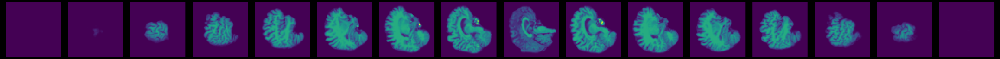

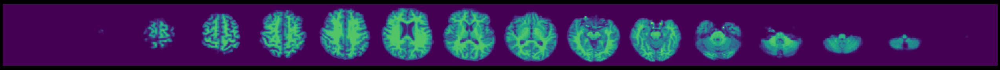

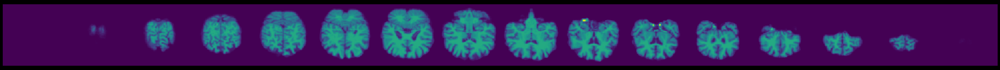

count: 1 processed: ../../ADNI/009_S_0862/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-04-04_14_13_49.0/S29424/mri/brainmask.mgz


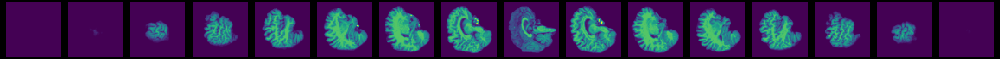

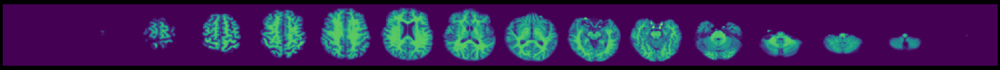

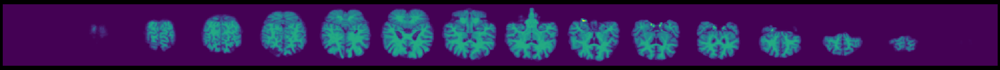

count: 2 processed: ../../ADNI/009_S_0862/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-09-19_12_53_39.0/S19358/mri/brainmask.mgz


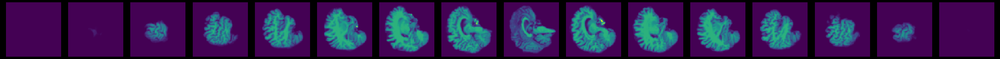

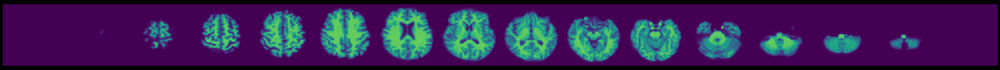

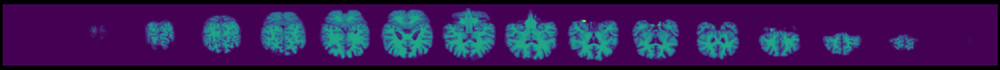

count: 3 processed: ../../ADNI/009_S_0862/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-10-11_12_37_20.0/S50553/mri/brainmask.mgz


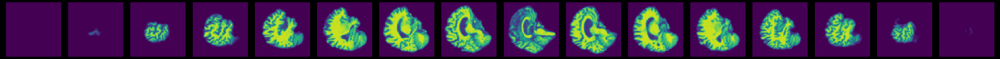

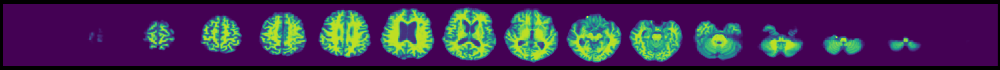

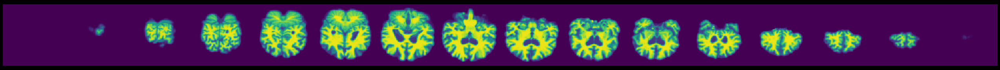

count: 4 processed: ../../ADNI/011_S_0856/FreeSurfer_Cross-Sectional_Processing_brainmask/2008-03-18_12_25_07.0/S47262/mri/brainmask.mgz


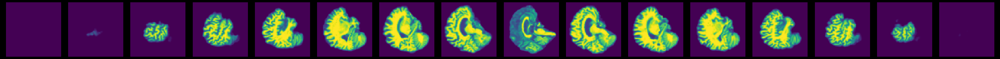

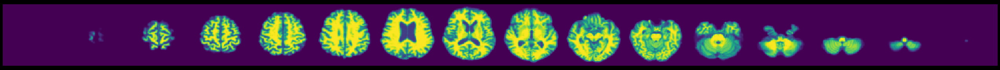

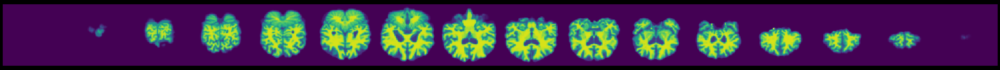

count: 5 processed: ../../ADNI/011_S_0856/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-09-15_11_47_59.0/S19031/mri/brainmask.mgz


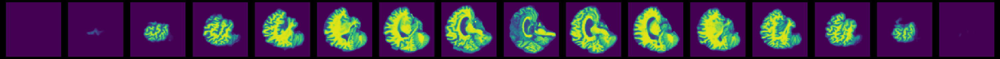

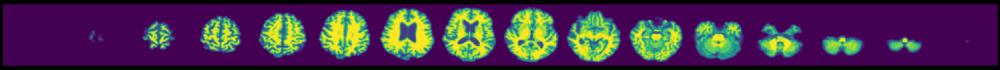

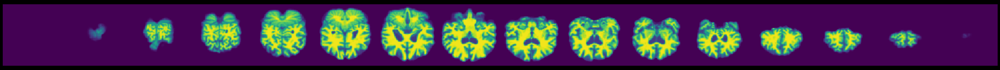

count: 6 processed: ../../ADNI/011_S_0856/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-03-29_12_23_19.0/S29108/mri/brainmask.mgz


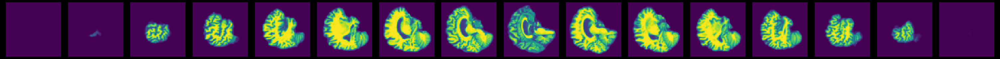

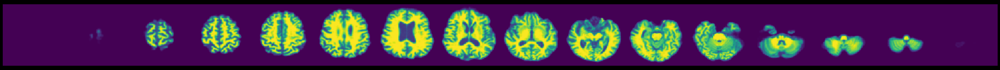

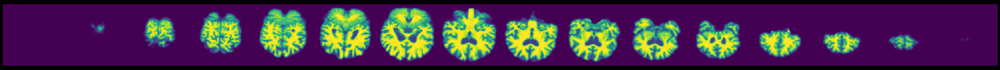

count: 7 processed: ../../ADNI/011_S_0856/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-09-25_12_25_55.0/S40766/mri/brainmask.mgz


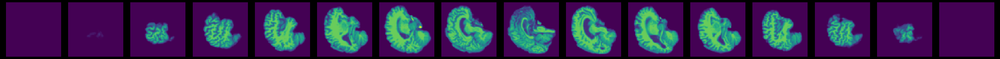

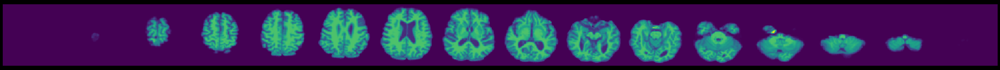

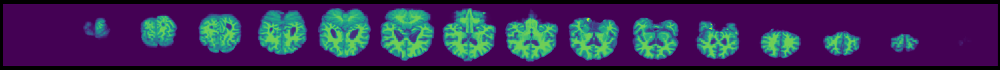

count: 8 processed: ../../ADNI/012_S_1009/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-11-27_10_13_11.0/S43083/mri/brainmask.mgz


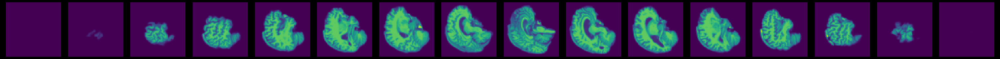

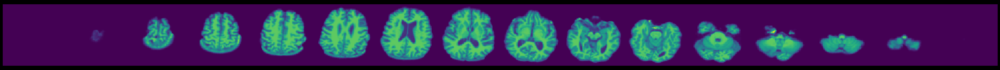

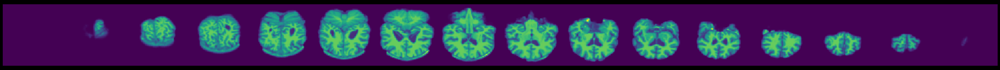

count: 9 processed: ../../ADNI/012_S_1009/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-11-01_07_26_40.0/S21610/mri/brainmask.mgz


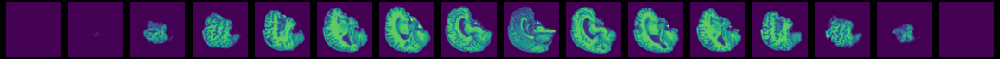

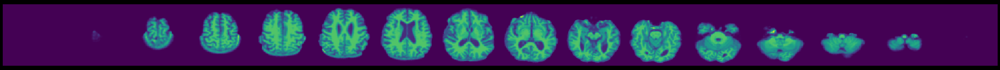

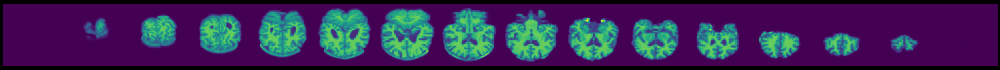

count: 10 processed: ../../ADNI/012_S_1009/FreeSurfer_Cross-Sectional_Processing_brainmask/2008-12-16_06_42_02.0/S60994/mri/brainmask.mgz


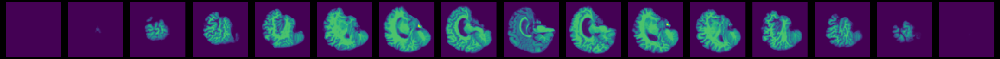

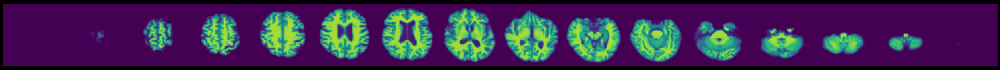

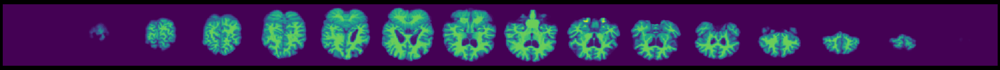

count: 11 processed: ../../ADNI/003_S_0908/FreeSurfer_Cross-Sectional_Processing_brainmask/2008-05-06_15_41_53.0/S49795/mri/brainmask.mgz


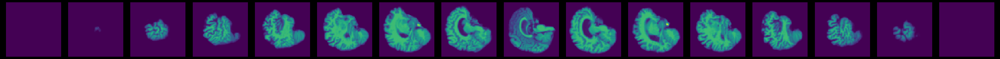

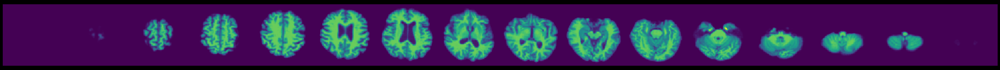

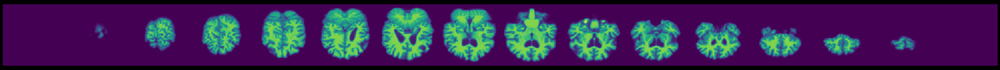

count: 12 processed: ../../ADNI/003_S_0908/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-04-23_14_18_36.0/S30451/mri/brainmask.mgz


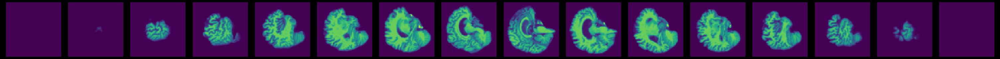

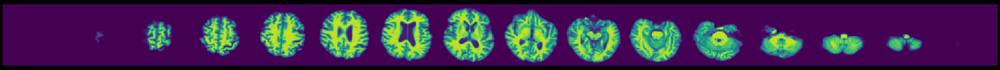

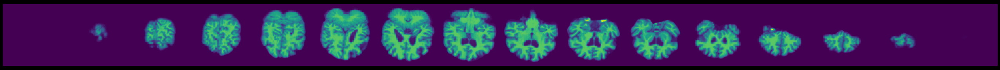

count: 13 processed: ../../ADNI/003_S_0908/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-10-25_09_48_26.0/S46187/mri/brainmask.mgz


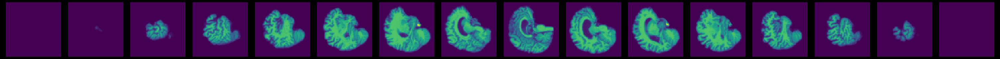

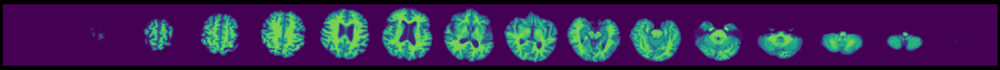

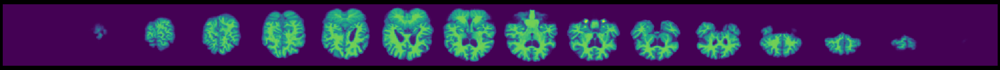

count: 14 processed: ../../ADNI/003_S_0908/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-09-12_16_07_53.0/S32516/mri/brainmask.mgz


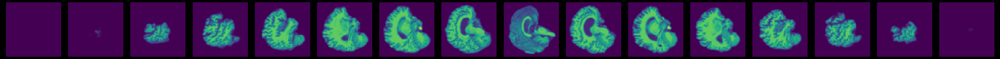

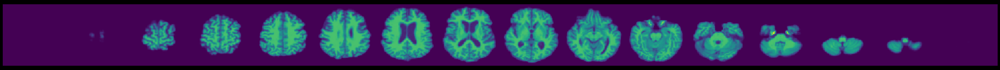

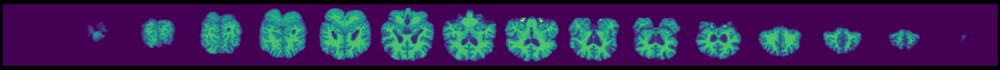

count: 15 processed: ../../ADNI/016_S_1149/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-01-04_08_05_46.0/S24786/mri/brainmask.mgz


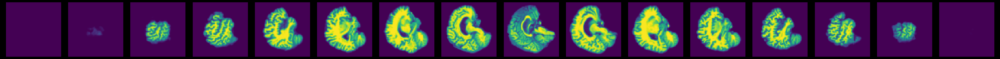

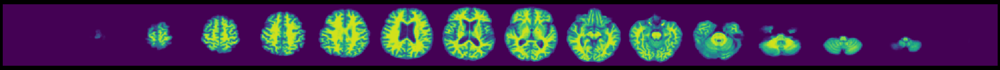

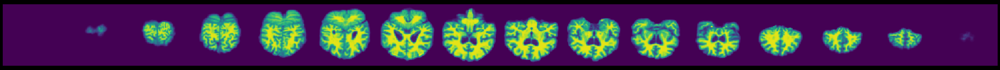

count: 16 processed: ../../ADNI/022_S_0004/FreeSurfer_Cross-Sectional_Processing_brainmask/2008-12-09_13_17_39.0/S60763/mri/brainmask.mgz


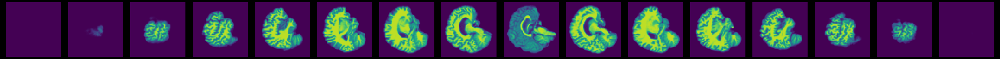

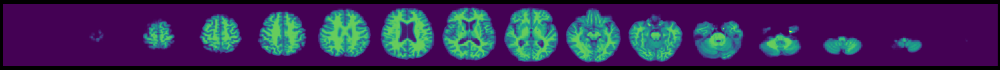

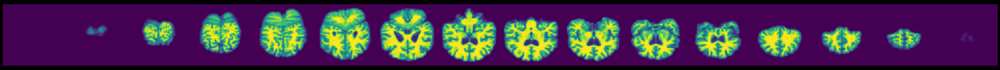

count: 17 processed: ../../ADNI/022_S_0004/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-05-25_15_19_48.0/S37029/mri/brainmask.mgz


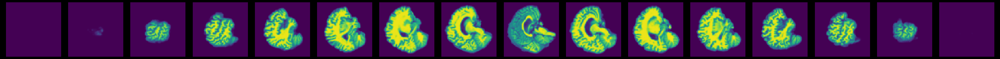

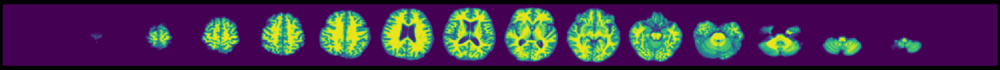

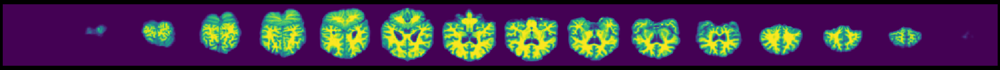

count: 18 processed: ../../ADNI/022_S_0004/FreeSurfer_Cross-Sectional_Processing_brainmask/2005-09-22_14_08_50.0/S9234/mri/brainmask.mgz


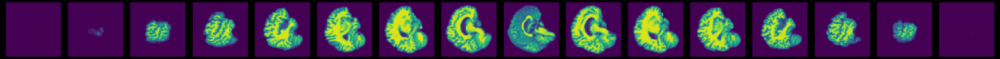

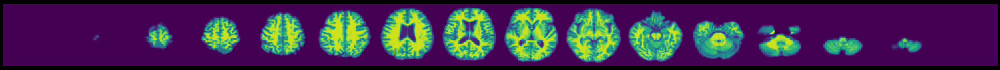

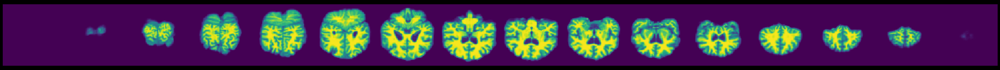

count: 19 processed: ../../ADNI/022_S_0004/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-05-25_15_14_46.0/S14969/mri/brainmask.mgz


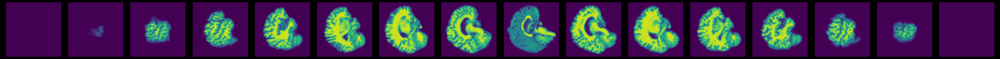

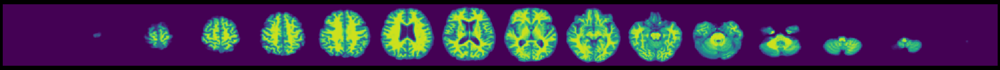

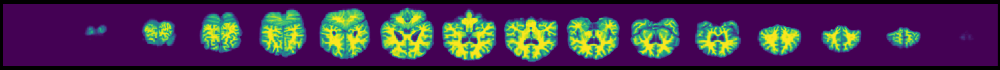

count: 20 processed: ../../ADNI/022_S_0004/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-11-28_11_09_19.0/S23080/mri/brainmask.mgz


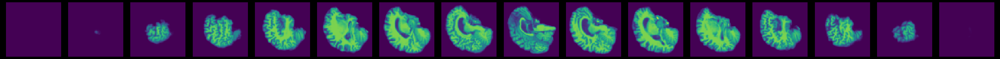

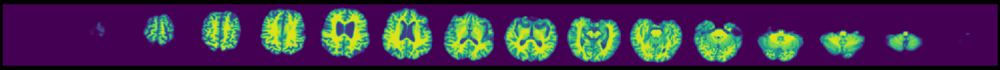

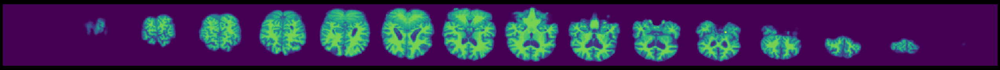

count: 21 processed: ../../ADNI/012_S_0932/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-11-05_13_16_19.0/S42499/mri/brainmask.mgz


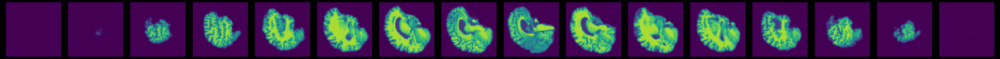

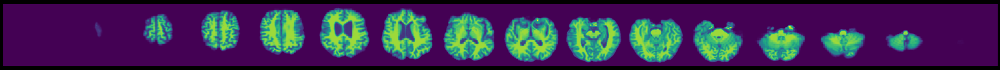

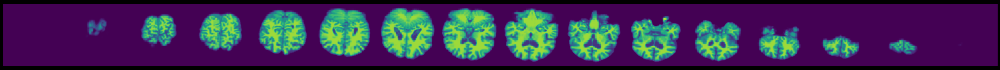

count: 22 processed: ../../ADNI/012_S_0932/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-09-20_12_49_02.0/S19374/mri/brainmask.mgz


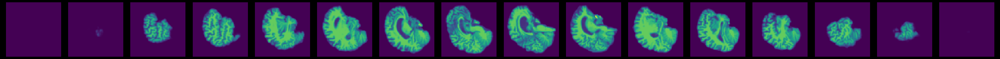

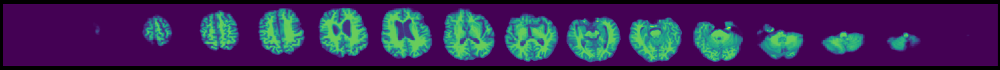

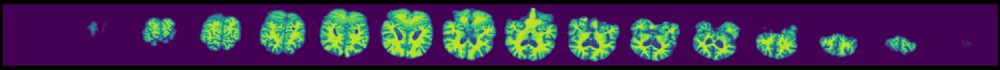

count: 23 processed: ../../ADNI/012_S_0932/FreeSurfer_Cross-Sectional_Processing_brainmask/2008-05-09_10_50_59.0/S50268/mri/brainmask.mgz


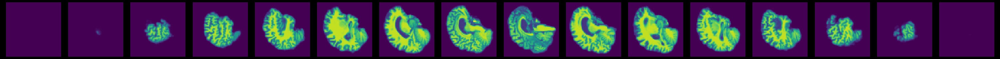

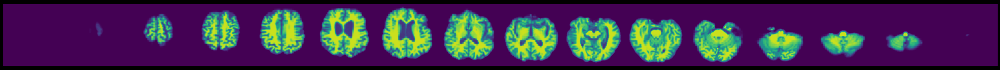

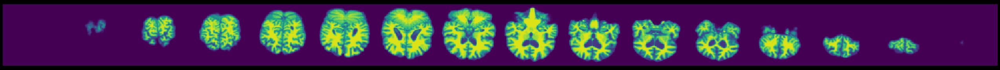

count: 24 processed: ../../ADNI/012_S_0932/FreeSurfer_Cross-Sectional_Processing_brainmask/2008-10-20_13_03_03.0/S57758/mri/brainmask.mgz


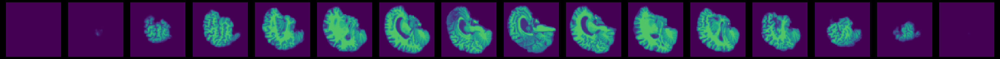

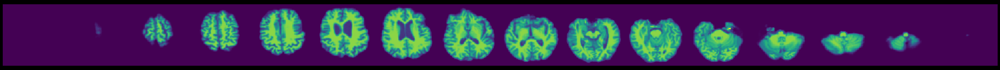

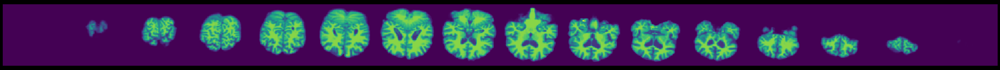

count: 25 processed: ../../ADNI/012_S_0932/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-05-02_07_53_25.0/S31659/mri/brainmask.mgz


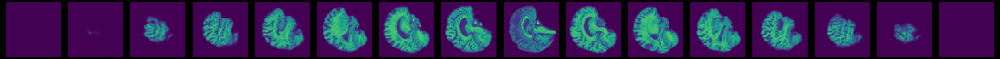

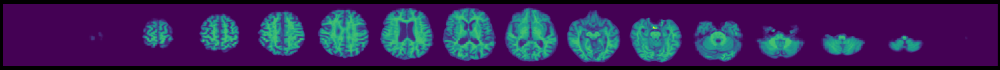

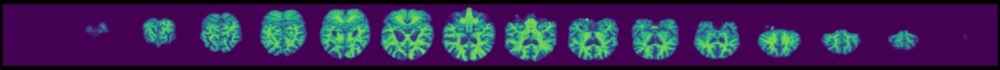

count: 26 processed: ../../ADNI/005_S_0929/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-05-09_12_30_31.0/S31920/mri/brainmask.mgz


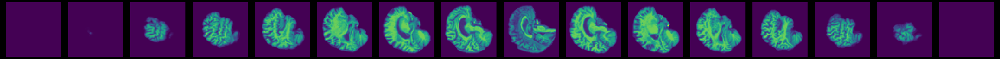

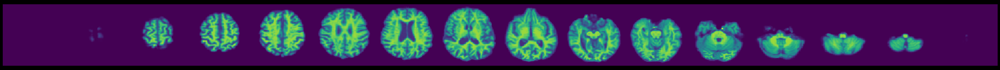

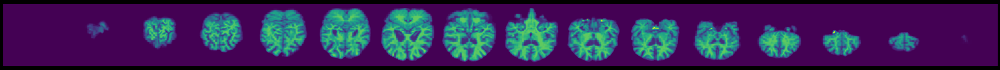

count: 27 processed: ../../ADNI/005_S_0929/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-10-02_11_02_34.0/S19669/mri/brainmask.mgz


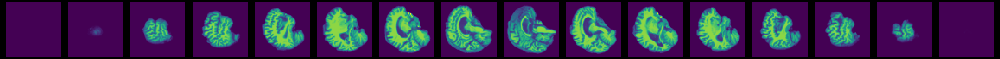

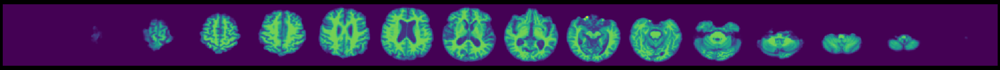

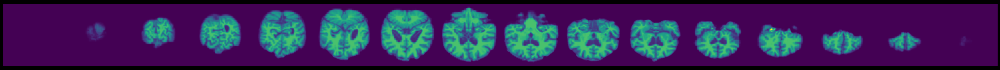

count: 28 processed: ../../ADNI/018_S_0369/FreeSurfer_Cross-Sectional_Processing_brainmask/2008-05-13_13_06_11.0/S50108/mri/brainmask.mgz


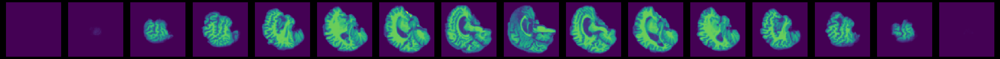

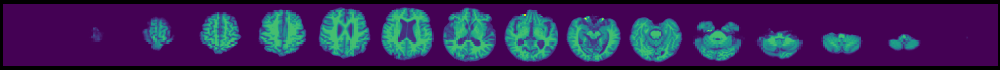

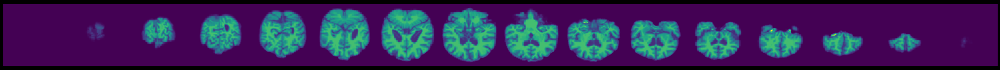

count: 29 processed: ../../ADNI/018_S_0369/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-04-24_11_58_48.0/S37384/mri/brainmask.mgz


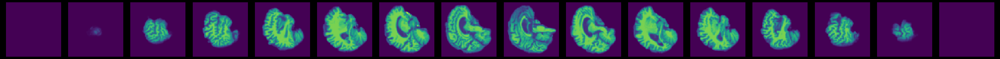

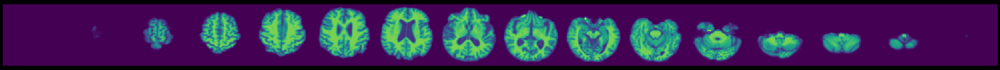

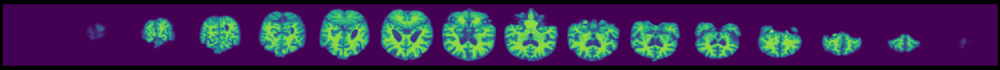

count: 30 processed: ../../ADNI/018_S_0369/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-03-30_16_37_02.0/S12613/mri/brainmask.mgz


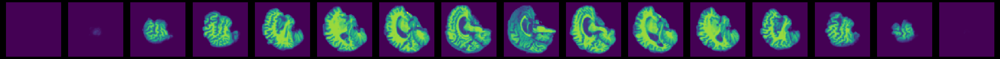

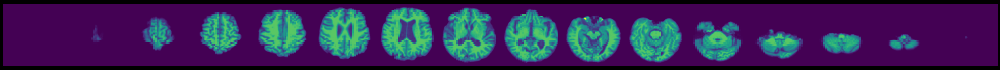

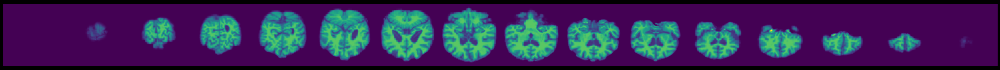

count: 31 processed: ../../ADNI/018_S_0369/FreeSurfer_Cross-Sectional_Processing_brainmask/2006-10-27_14_30_45.0/S21216/mri/brainmask.mgz


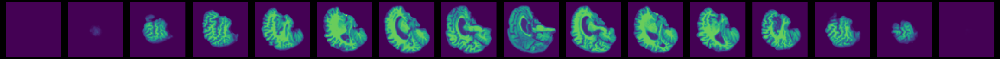

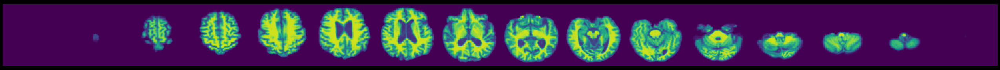

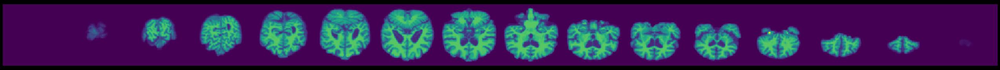

count: 32 processed: ../../ADNI/018_S_0369/FreeSurfer_Cross-Sectional_Processing_brainmask/2009-07-16_15_45_46.0/S70301/mri/brainmask.mgz


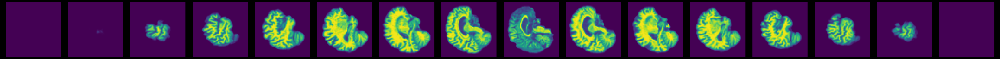

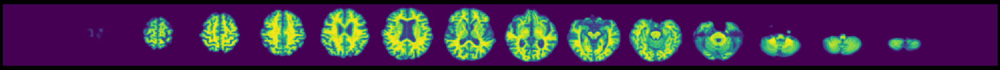

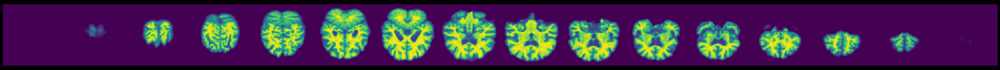

count: 33 processed: ../../ADNI/020_S_0899/FreeSurfer_Cross-Sectional_Processing_brainmask/2009-11-16_17_39_02.0/S76597/mri/brainmask.mgz


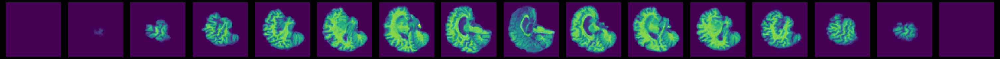

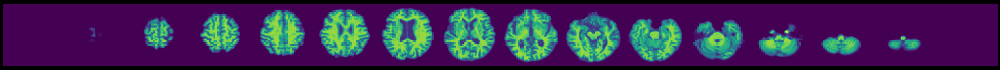

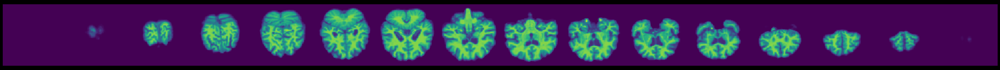

count: 34 processed: ../../ADNI/020_S_0899/FreeSurfer_Cross-Sectional_Processing_brainmask/2007-05-14_17_58_42.0/S32312/mri/brainmask.mgz


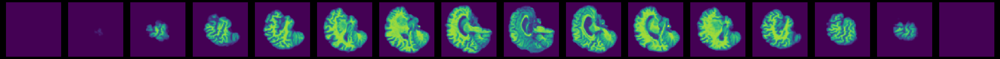

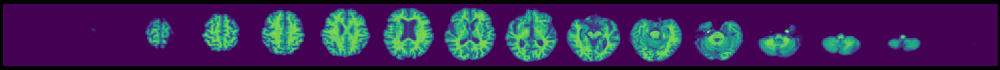

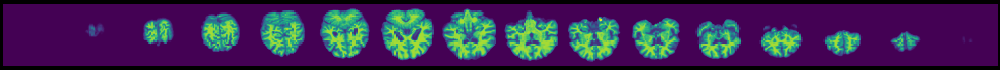

count: 35 processed: ../../ADNI/020_S_0899/FreeSurfer_Cross-Sectional_Processing_brainmask/2008-01-09_16_44_09.0/S44443/mri/brainmask.mgz


KeyboardInterrupt: 

In [3]:
if __name__ == '__main__':
    dive('../../ADNI')